In [ ]:
!pip install Pillow
!pip install shapely

import cv2
import os

In [ ]:
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15353, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 15353 (delta 54), reused 53 (delta 53), pack-reused 15293
Receiving objects: 100% (15353/15353), 13.98 MiB | 18.29 MiB/s, done.
Resolving deltas: 100% (10323/10323), done.


In [ ]:
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

/content/darknet


In [ ]:
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [ ]:
!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:946:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1147:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
             if (iteration_old == 0)
             ^~
./src/image_

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2021-11-12 07:16:14--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  59.3MB/s    in 4.2s    

2021-11-12 07:16:19 (56.0 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

def download(path):
  from google.colab import files
  files.download(path)

def FrameCapture(path):
      
    vidObj = cv2.VideoCapture(path)
  
    count = 0
  
    success = 1
    writepath = '/mydrive/yolov3/images/'
  
    while success:
        vidObj.set(cv2.CAP_PROP_POS_MSEC,(count*30000))
        success, image = vidObj.read()
  
        if image is not None :
         cv2.imwrite(os.path.join(writepath,"frame%d.jpg" % count), image)
  
        count += 1
  

In [ ]:
!./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5, 

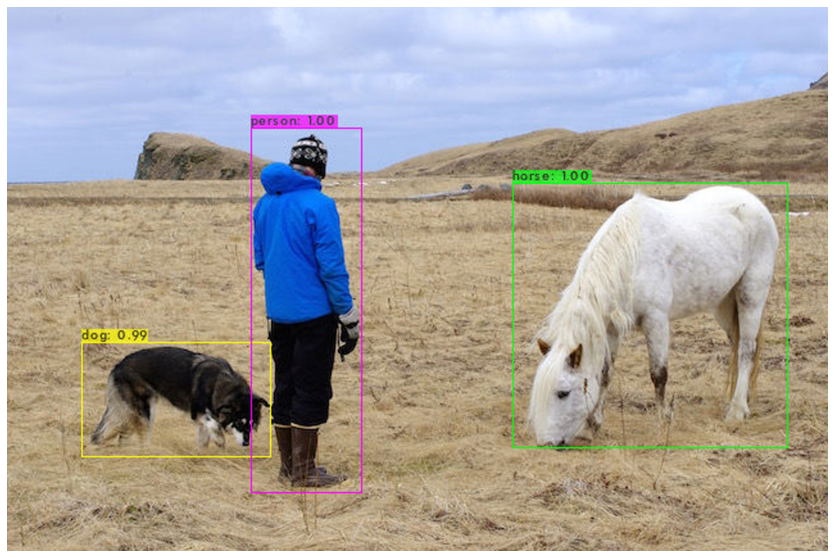

In [ ]:
imShow('predictions.jpg')

 CUDA-version: 11000 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5, 

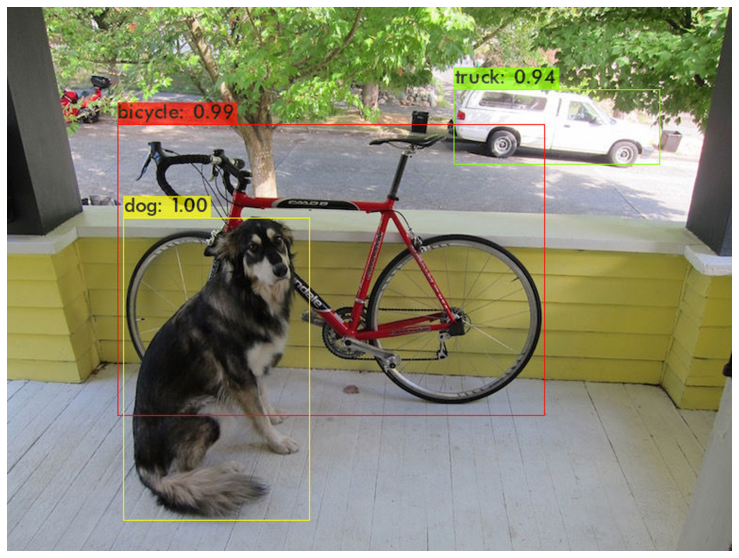

In [ ]:
!./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg
imShow('predictions.jpg')

In [ ]:
%cd darknet
#!./darknet detect cfg/yolov3.cfg yolov3.weights ../street.jpg
#imShow('predictions.jpg')

[Errno 20] Not a directory: 'darknet'
/content/darknet


In [ ]:
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

/content
Mounted at /content/gdrive


In [ ]:
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

 1609163768201701576297.jpg
 43KaruneshPalekarSEAllExpts.pdf
 43_PYTHON_EXPT_KaruneshChetanPalekar.pdf
'5-Bresenham'\''s circle drawing algo (1).gdoc'
'5-Bresenham'\''s circle drawing algo (2).gdoc'
'5-Bresenham'\''s circle drawing algo (3).gdoc'
'5-Bresenham'\''s circle drawing algo (4).gdoc'
"5-Bresenham's circle drawing algo.gdoc"
'5-Course Outcomes (CO'\''s CG Pract)-2020-21 (1).gdoc'
'5-Course Outcomes (CO'\''s CG Pract)-2020-21.gdoc'
'5-Course Outcomes (CO'\''s MP-TH)-2020-21-Even.gdoc'
'8-Polygon Introduction.gdoc'
 A3036SEM3CGQ2.pdf
 A3036SEM3CGQ3.pdf
 A3036Sem3EmgineeringmathsQ3.pdf
 A3036Sem3EngineeringMathsQ2.pdf
 A3036Semester3DLCOAQ.2.pdf
 A3036Semester3DLCOAQ3.pdf
 A3036Semester3DSGTQ3.pdf
 A3036Semester3Q2.pdf
 A3036Semester3Q3.pdf
 A3036SemesterThirdDSGTQ2.pdf
'Academic Arrangements for Odd Sem 20-21 (1).pdf'
'Academic Arrangements for Odd Sem 20-21.pdf'
'AntiRagging Details.pdf'
'AOA Expriment list.gdoc'
'AOA lab Manual (1).gdoc'
'AOA lab Manual.gdoc'
'aoa-tygb-jdk - J

In [ ]:
#%cd /mydrive/yolov3/images
#!unzip testobj.zip

/content/gdrive/My Drive/yolov3/images
unzip:  cannot find or open testobj.zip, testobj.zip.zip or testobj.zip.ZIP.


In [ ]:
FrameCapture("/mydrive/sample.mp4")

In [ ]:
%cd ../../../..

/content


In [ ]:
%cd darknet
#!./darknet detect cfg/yolov3.cfg yolov3.weights /mydrive/images/plane.jpg
#imShow('predictions.jpg')

/content/darknet


In [ ]:
download('predictions.jpg')

In [ ]:
!cp predictions.jpg /mydrive/images/detection1.jpg

In [ ]:
!ls /mydrive/yolov3

backup	   generate_train.py  name.py	 obj.zip     result.txt
cnn.csv    images	      obj.data	 output.txt  yolov3_custom.cfg
final.csv  last_weight	      obj.names  results


In [ ]:
!cp /mydrive/yolov3/obj.zip ../

In [ ]:
!unzip ../obj.zip -d data/

Archive:  ../obj.zip
  inflating: data/obj/1.jpg          
  inflating: data/obj/1.txt          
  inflating: data/obj/10.jpg         
  inflating: data/obj/10.txt         
  inflating: data/obj/101.jpg        
  inflating: data/obj/101.txt        
  inflating: data/obj/102.jpg        
  inflating: data/obj/102.txt        
  inflating: data/obj/103.jpg        
  inflating: data/obj/103.txt        
  inflating: data/obj/104.jpg        
  inflating: data/obj/104.txt        
  inflating: data/obj/105.jpg        
  inflating: data/obj/105.txt        
  inflating: data/obj/106.jpg        
  inflating: data/obj/106.txt        
  inflating: data/obj/108.jpg        
  inflating: data/obj/108.txt        
  inflating: data/obj/109.jpg        
  inflating: data/obj/109.txt        
  inflating: data/obj/11.jpg         
  inflating: data/obj/11.txt         
  inflating: data/obj/110.jpg        
  inflating: data/obj/110.txt        
  inflating: data/obj/111.jpg        
  inflating: data/obj/111.txt

In [ ]:
#!cp cfg/yolov3.cfg /mydrive/yolov3/yolov3_custom.cfg

In [ ]:
download('cfg/yolov3.cfg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!cp /mydrive/yolov3/yolov3_custom.cfg ./cfg

#%cd cfg
#upload()
#%cd .. 

In [ ]:
!cp /mydrive/yolov3/obj.names ./data
!cp /mydrive/yolov3/obj.data  ./data

#%cd data
#upload()
#%cd .. 

In [ ]:
!cp /mydrive/yolov3/generate_train.py ./
#upload()


In [ ]:
!python generate_train.py

In [ ]:
!ls data/

9k.tree     eagle.jpg	 imagenet.labels.list	   obj.data	     scream.jpg
coco9k.map  giraffe.jpg  imagenet.shortnames.list  obj.names	     train.txt
coco.names  goal.txt	 labels			   openimages.names  voc.names
dog.jpg     horses.jpg	 obj			   person.jpg


In [ ]:
!wget http://pjreddie.com/media/files/darknet53.conv.74

URL transformed to HTTPS due to an HSTS policy
--2021-11-12 07:27:38--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M  52.3MB/s    in 3.0s    

2021-11-12 07:27:41 (52.3 MB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



In [ ]:
function ClickConnect(){
console.log("Working"); 
document.querySelector("colab-toolbar-button#connect").click() 
}
setInterval(ClickConnect,60000)

In [ ]:
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg darknet53.conv.74 -dont_show

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
yolov3_custom
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 4, batch = 64, time_steps = 1, train = 1 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shor

In [ ]:
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights -dont_show

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
yolov3_custom
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 4, batch = 64, time_steps = 1, train = 1 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shor

In [ ]:
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov3_custom.cfg
!sed -i 's/subdivisions=64/subdivisions=1/' yolov3_custom.cfg
%cd ..


/content/darknet/cfg
/content/darknet


In [ ]:

finaldict = []
mydict = []
dict=[]
dictofpolygonpoints =[]

list = []
listofFinal = []

area =0 
areaofthewholeimage=0



 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

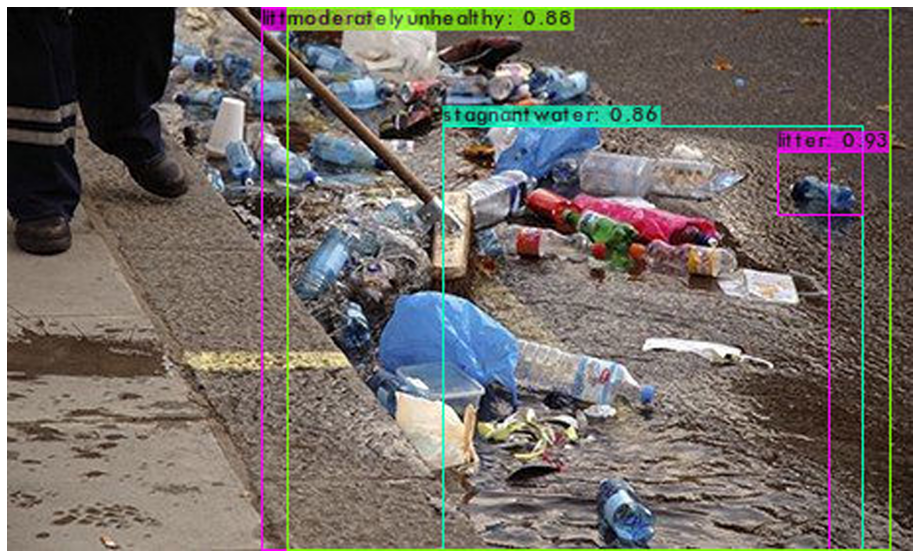

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/obj/9.jpg  -ext_output > output.txt
imShow('predictions.jpg')

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

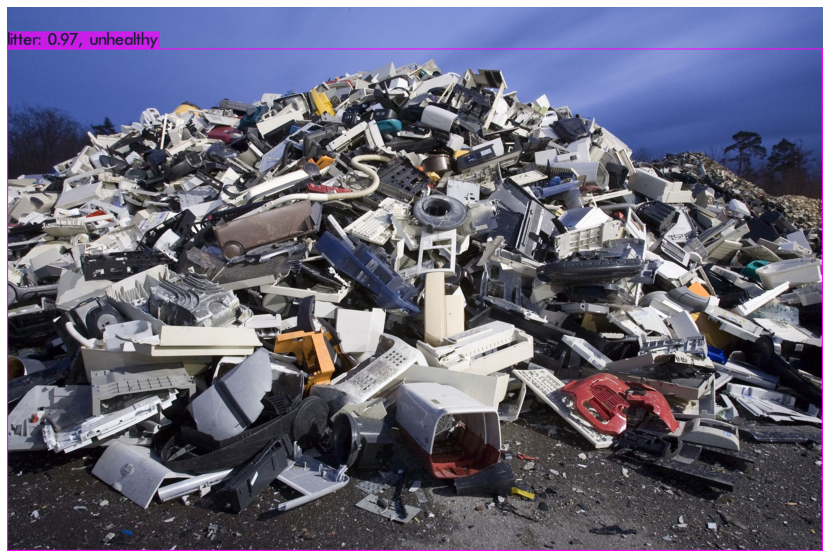

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/obj/10.jpg  -ext_output > output.txt
imShow('predictions.jpg')

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

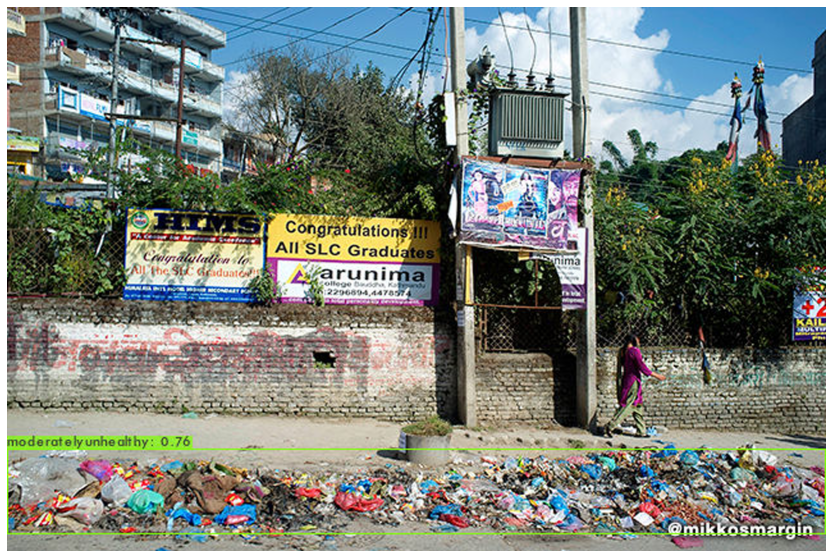

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/obj/11.jpg  -ext_output > output.txt
imShow('predictions.jpg')

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

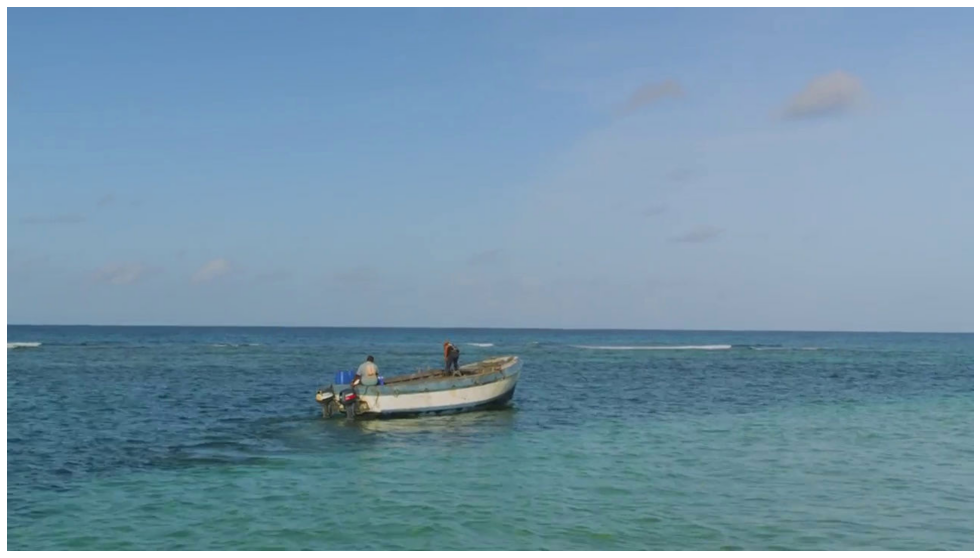

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/frame2.jpg  -ext_output > output.txt
imShow('predictions.jpg')

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

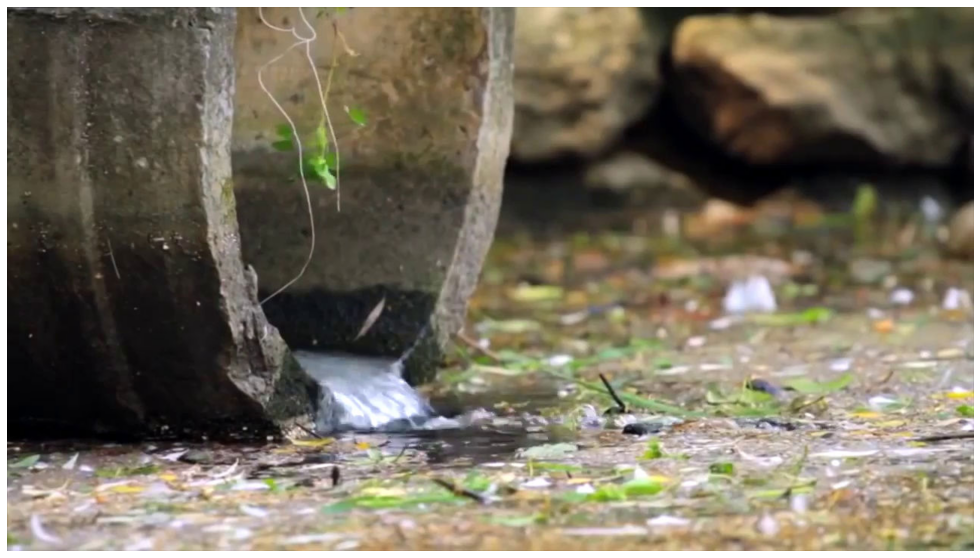

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/frame5.jpg  -ext_output > output.txt
imShow('predictions.jpg')

Post Processing 


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

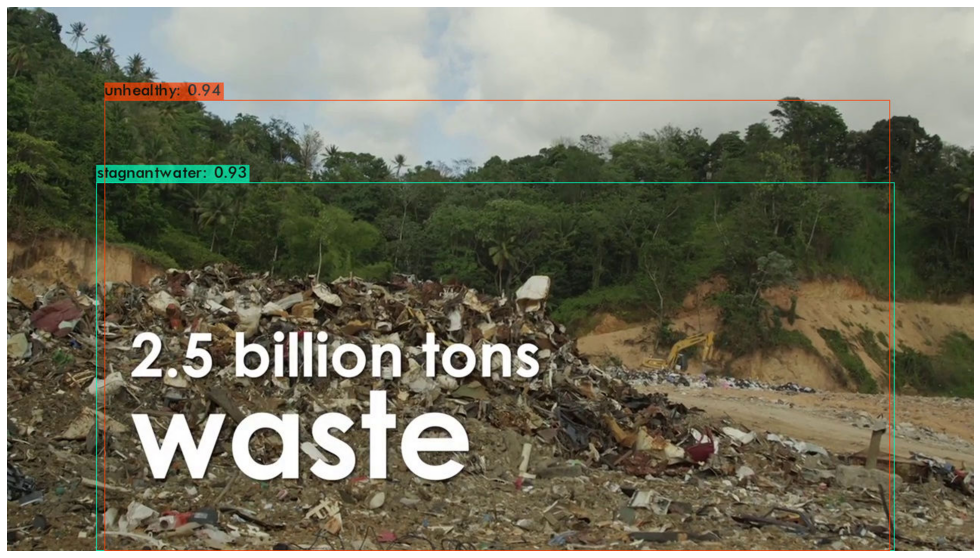

stagnantwater
Percentage 93
LeftX 119
TopY 233
Width 1056
Height 553
[{'label': 'stagnantwater', 'score': '93', 'left': '119', 'top': '233', 'width': '1056', 'height': '553'}]
unhealthy
Percentage 94
LeftX 130
TopY 123
Width 1039
Height 677
[{'label': 'stagnantwater', 'score': '93', 'left': '119', 'top': '233', 'width': '1056', 'height': '553'}, {'label': 'unhealthy', 'score': '94', 'left': '130', 'top': '123', 'width': '1039', 'height': '677'}]


In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/frame1.jpg -thresh 0.5  -ext_output > output.txt
#imShow('predictions.jpg')

import re
import csv
file = open('output.txt')
  
content = file.readlines()
  
#print(len(content))  
#print(type(content))  
#print(content[10])
#print(content[11])
for i in range(10,len(content) ):
  totalValue = content[i].split(':')[0].strip()
  list = re.findall(r'\b\d+\b', content[i])
  print(totalValue)
  mydict.append({'label': totalValue, 'score': list[0]})
  dict.append({'label': totalValue, 'score': list[0],'left':list[1],'top':list[2],'width':list[3],'height':list[4]})
  print('Percentage',list[0])
  print('LeftX',list[1])
  print('TopY',list[2])
  print('Width',list[3])
  print('Height',list[4])


  print(dict)

In [ ]:
print("Dict is" , mydict) 

Dict is [{'label': 'stagnantwater', 'score': '93'}, {'label': 'unhealthy', 'score': '94'}, {'label': 'stagnantwater', 'score': '93'}, {'label': 'unhealthy', 'score': '94'}, {'label': 'stagnantwater', 'score': '32'}, {'label': 'stagnantwater', 'score': '32'}, {'label': 'stagnantwater', 'score': '93'}, {'label': 'unhealthy', 'score': '94'}, {'label': 'stagnantwater', 'score': '89'}, {'label': 'stagnantwater', 'score': '83'}, {'label': 'unhealthy', 'score': '41'}, {'label': 'stagnantwater', 'score': '82'}, {'label': 'stagnantwater', 'score': '41'}, {'label': 'stagnantwater', 'score': '41'}, {'label': 'stagnantwater', 'score': '65'}, {'label': 'unhealthy', 'score': '52'}, {'label': 'stagnantwater', 'score': '93'}, {'label': 'unhealthy', 'score': '94'}, {'label': 'stagnantwater', 'score': '89'}, {'label': 'stagnantwater', 'score': '83'}, {'label': 'stagnantwater', 'score': '82'}, {'label': 'stagnantwater', 'score': '65'}, {'label': 'unhealthy', 'score': '52'}, {'label': 'stagnantwater', 'sc

In [ ]:
from PIL import Image

filepath = "/mydrive/yolov3/images/obj/1.jpg"
img = Image.open(filepath)

width = img.width
height = img.height

areaofthewholeimage=width*height
print(areaofthewholeimage)

3538944


In [ ]:
for i in range(0,len(dict)):
 dictofpolygonpoints.append({'BottomLeft':(int(dict[i]['left']) ,int(dict[i]['top'])) ,
 'BottomRight': (int(dict[i]['left']) + int(dict[i]['width']),int(dict[i]['top'])),
 'TopLeft': (int(dict[i]['left']),int(dict[i]['top']) + int(dict[i]['height'])),
 'TopRight':(int(dict[i]['left']) + int(dict[i]['width']),int(dict[i]['top']) + int(dict[i]['height'])),
 'Area':int(dict[i]['height']) * int(dict[i]['width'])
 })

print(dictofpolygonpoints)

[{'BottomLeft': (119, 233), 'BottomRight': (1175, 233), 'TopLeft': (119, 786), 'TopRight': (1175, 786), 'Area': 583968}, {'BottomLeft': (130, 123), 'BottomRight': (1169, 123), 'TopLeft': (130, 800), 'TopRight': (1169, 800), 'Area': 703403}]


In [ ]:
from shapely.geometry import Polygon
for j in range(0,len(dictofpolygonpoints)):
 #Added as final area
 listofFinal.append(dictofpolygonpoints[j]['TopRight'][0] * dictofpolygonpoints[j]['TopRight'][1])
 #Forming an polygon inside a list
 list.append([Polygon([(dictofpolygonpoints[j]['BottomLeft']),(dictofpolygonpoints[j]['BottomRight']),(dictofpolygonpoints[j]['TopLeft']),(dictofpolygonpoints[j]['TopRight'])])])

print(list)


['27', '31', '45', '200', '121', [<shapely.geometry.polygon.Polygon object at 0x7f8574c9f990>], [<shapely.geometry.polygon.Polygon object at 0x7f8585eb7fd0>]]


In [ ]:
def checkforIntersection(polya,polyb):
 for pointsa in polya :
  for pointsb in polyb :
    xdiff = (line1[pointsa][0] - line1[pointsa][1], line2[pointsa][0] - line2[pointsb][3])
    ydiff = (line1[pointsb][3] - line1[pointsb][2], line2[pointsb][1] - line2[pointsb][2])

    def det(a, b):
        return a[0] * b[1] - a[1] * b[0]

    div = det(xdiff, ydiff)
    if div == 0:
       raise Exception('lines do not intersect')

    d = (det(*line1), det(*line2))
    x = det(d, xdiff) / div
    y = det(d, ydiff) / div
    polyc = Polygon((polya[0],x),(x,polya[1]),(polya[0]),y),(x,y))
    polyd = Polygon((x,poly[1]),(poly[2],y),(x,y),(poly[2],y))
    if polya.contains(polyc):
      print('Do nothing')
    else :
      listofFinal.add(x*y)
    if polya.contains(polyd):
        print('Do nothing')
    else :
     listofFinal.add(poly[1]*poly[2])

In [ ]:
  for k in range(0,len(list)):
   for z in range(0,len(list) - 1):
    polya = list[z][0]
    polyb = list[z+1][0]
    value = polya.contains(polyb)
    if value == True:
     checkforIntersection(polya,polyb)
     listofFinal.remove(polya)
     listofFinal.remove(polyb)
   else :
    print("AlreadyPresent") 


In [ ]:
for a in range(0,len(listofFinal)):
 area = area + listofFinal[a]

In [ ]:
threshold = 30
unhealthypercent = (areaofthewholeimage * 100) / area
if unhealthypercent >= threshold:
  print("Unhealthy")
  finaldict.append({'state': 0})
else :
  print("Healthy")
  finaldict.append({'state': 1})



Unhealthy


In [ ]:
dict.clear()
dictofpolygonpoints.clear()
list.clear()
listofFinal.clear()
area =0 
areaofthewholeimage=0


In [ ]:
print(finaldict)

In [ ]:
healthy = sum(value == 1 for value in finaldict.values())
unhealthy = sum(value == 0 for value in finaldict.values())

if healthy == unhealthy:
 print('UnHealthy')
elif healthy > unhealthy:
 print('Healthy') 
else :
 print('UnHealthy')

Healthy


CNN Conversion's

In [ ]:
import csv
fields = ['label','score']
	
filename = "cnn.csv"
	
with open(filename, 'w') as csvfile:
	writer = csv.DictWriter(csvfile, fieldnames = fields)
	writer.writeheader()
	writer.writerows(mydict)



In [ ]:
fields = ['state']
	
filename = "final.csv"
	
with open(filename, 'w') as csvfile:
	writer = csv.DictWriter(csvfile, fieldnames = fields)
	writer.writeheader()
	writer.writerows(finaldict)


Json Formating 


In [ ]:
import json

def get_data(distros_dict):
    json_to_variable = []
    # For every frame.
    for distro in distros_dict:
        filename = distro['filename']
        if len(distro['objects']) != 0:
            # For every detection.
            for obj in range(len(distro['objects'])):
                # Get values.
                frame_id = distro['frame_id']
                class_id = distro['objects'][obj]["class_id"]
                x = distro['objects'][obj]["relative_coordinates"]["center_x"]
                y = distro['objects'][obj]["relative_coordinates"]["center_y"]
                width = distro['objects'][obj]["relative_coordinates"]["width"]
                height = distro['objects'][obj]["relative_coordinates"]["height"]
                confidence = distro['objects'][obj]["confidence"]
                # And save them.
                print(f"{frame_id} {class_id} {x} {y} {width} {height} {confidence}")
                json_to_variable.append([frame_id, class_id, x, y, width, height, confidence])

In [ ]:
with open('train.json', 'r') as f:
  get_data(json.load(f))

Testing's as per Threshold

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights -dont_show < data/train.txt > result.txt


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,

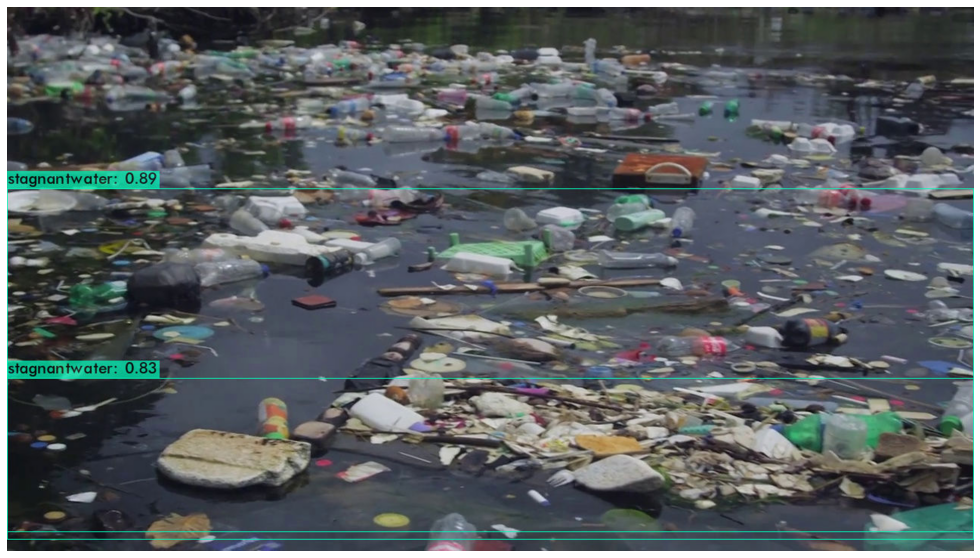

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/frame3.jpg -thresh 0.8
imShow('predictions.jpg')


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,

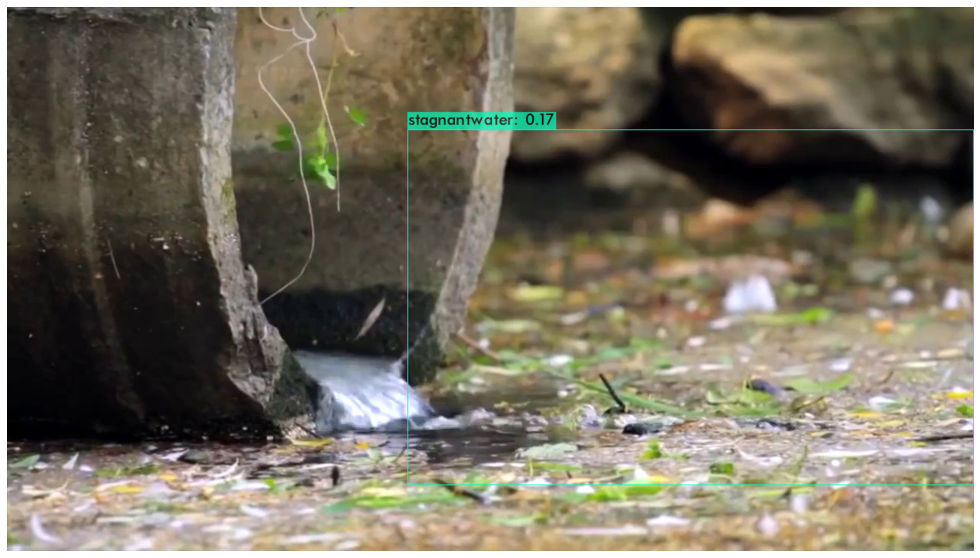

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/frame5.jpg -thresh 0.1
imShow('predictions.jpg')


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,

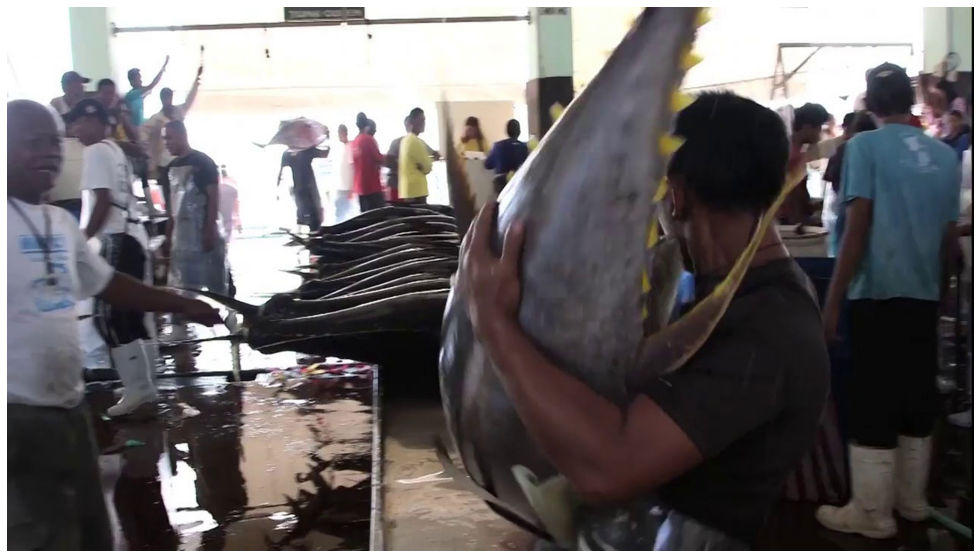

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last.weights /mydrive/yolov3/images/frame7.jpg -thresh 0.7
imShow('predictions.jpg')


Testing Based on Different Weights 


 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,

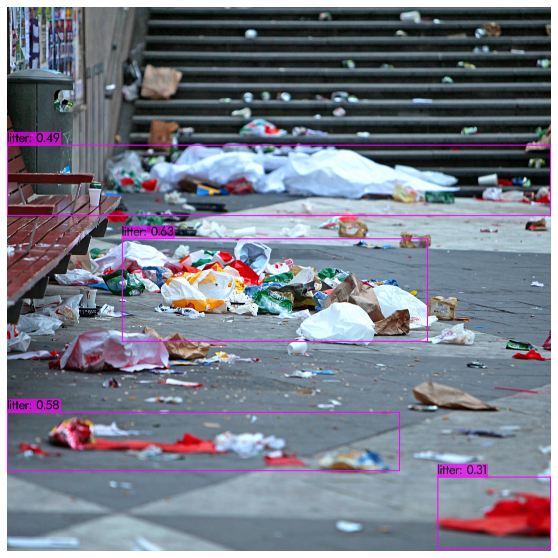

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last_2000.weights /mydrive/yolov3/images/obj/17.jpg 
imShow('predictions.jpg')

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 104 x 128 0.001 BF
   9 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 

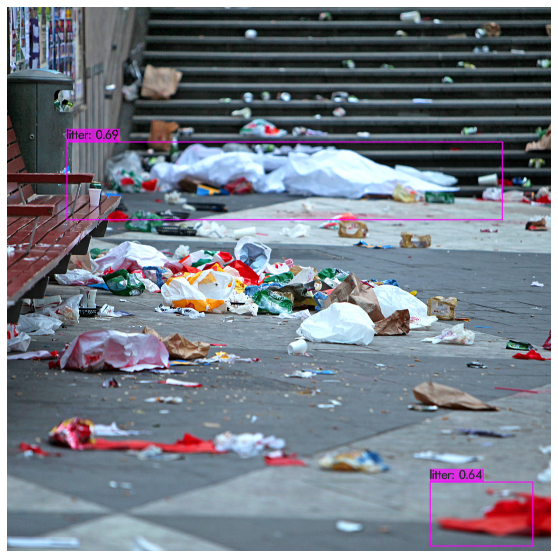

In [ ]:
!./darknet detector test data/obj.data cfg/yolov3_custom.cfg /mydrive/yolov3/backup/yolov3_custom_last_1300.weights /mydrive/yolov3/images/obj/17.jpg -thresh 0.5  -ext_output > output.txt
imShow('predictions.jpg')
